In [2]:
import sklearn
import pickle
import numpy as np 
import tensorflow as tf
from ClassificationModels.CNN_T import ResNetBaseline, get_all_preds, fit, UCRDataset
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import pandas as pd
import os 
from tslearn.datasets import UCR_UEA_datasets

2022-07-06 13:26:04.117122: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-07-06 13:26:04.117139: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Parameters

In [3]:
#TODO Test and show results on Forest Cover Dataset 
dataset='ElectricDevices'

# Load Data

In [4]:

train_x,test_x, train_y, test_y = load_data.load_basic_dataset(dataset,scaling=None,mode='time',cwd='/media/jacqueline/Data/UCRArchive_2018/')

NameError: name 'load_data' is not defined

In [ ]:
print(test_y.shape)

(7711,)


In [ ]:
enc1=pickle.load(open(f'./ClassificationModels/models/{dataset}/OneHotEncoder.pkl','rb'))
train_y=enc1.transform(train_y.reshape(-1,1))
test_y=enc1.transform(test_y.reshape(-1,1))

# Model Training

In [ ]:
model = tf.keras.models.load_model(f'./ClassificationModels/models/{dataset}/cnn/best_model.hdf5')

2022-06-09 10:34:17.307210: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-06-09 10:34:17.331025: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-09 10:34:17.331236: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: Quadro T1000 computeCapability: 7.5
coreClock: 1.455GHz coreCount: 14 deviceMemorySize: 3.81GiB deviceMemoryBandwidth: 119.24GiB/s
2022-06-09 10:34:17.331310: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-06-09 10:34:17.331376: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcubl

# Explanation Algo

In [ ]:
item=train_x[10].reshape(1,-1,1)
shape=item.shape
y_target = model.predict(item)

2022-06-09 10:34:17.449315: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-06-09 10:34:17.450823: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2599990000 Hz


In [ ]:
print(shape)

(1, 96, 1)


In [ ]:
print(y_target)

[[9.8108339e-01 2.4344199e-32 6.4369440e-03 1.0262093e-01 4.1660666e-02
  5.3780594e-05 2.5454164e-04]]


In [ ]:
from InterpretabilityModels.TSInsight.TSInsightTF import TSInsightTF
exp_model=TSInsightTF(model,(shape[1],shape[2]),(train_x,train_y),(test_x,test_y))
#TODO Issue could also be calculation of I !!!! 

here (8926, 96, 1)
Epoch 1/1000
279/279 [==============================] - 2s 4ms/step - loss: 0.9228 - val_loss: 0.9120
Epoch 2/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8564 - val_loss: 0.8776
Epoch 3/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8302 - val_loss: 0.8654
Epoch 4/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8231 - val_loss: 0.8663
Epoch 5/1000
279/279 [==============================] - 1s 2ms/step - loss: 0.8204 - val_loss: 0.8460
Epoch 6/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8105 - val_loss: 0.8439
Epoch 7/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8110 - val_loss: 0.8506
Epoch 8/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8242 - val_loss: 0.8661
Epoch 9/1000
279/279 [==============================] - 1s 3ms/step - loss: 0.8412 - val_loss: 0.8601
Epoch 10/1000
279/279 [==============================] - 1s 3ms

In [ ]:
exp=exp_model.explain(item)

In [ ]:
exp

array([[[nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [nan],
        [n

In [ ]:
np.count_nonzero(item.flatten()-exp.flatten())

96

In [ ]:
exp.shape

(1, 96, 1)

In [ ]:
item.shape

(1, 96, 1)

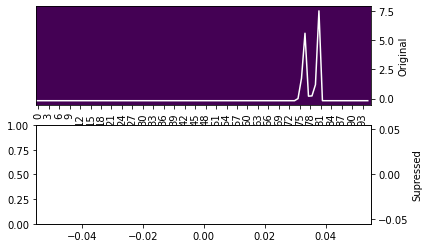

In [ ]:
#TODO scale og plot
exp_model.plot(item, exp,all_in_one=False)

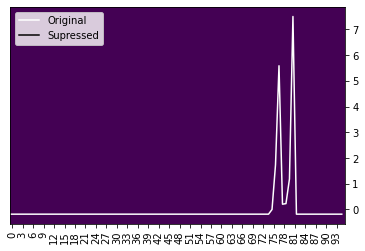

In [ ]:
exp_model.plot(item, exp)

<AxesSubplot:>

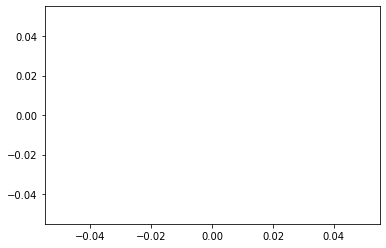

In [ ]:
sns.lineplot(x=range(0,len(exp.reshape(-1))), y=exp.flatten(), color='black')

In [ ]:
#print(exp)

In [ ]:
#print(exp.shape)

# Plot Item 

In [ ]:

#exp_model.plot(item,np.argmax(y_target,axis=1)[0],exp,label)

In [ ]:
e#xp_model.plot_in_one(item,np.argmax(y_target,axis=1)[0],exp,label)

NameError: name 'e' is not defined